# (24) GRA — AdamW vs. GR-Lion


project = ```GRA```, host = ```any```, device = ```any```


In [1]:
# HIDE CODE


import os, pathlib
from IPython.display import display

# tmp & extras dir
_jb_dir = pathlib.Path(os.environ['HOME'])
_jb_dir /= 'Dropbox/git/jb-progress-2026'
extras_dir = _jb_dir / '_extras'
fig_base_dir = _jb_dir / 'figs'
tmp_dir = _jb_dir / 'tmp'

# GitHub 
from gra.utils.plotting import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from gra.optimizers import GeneralRelativisticLion

## Gemini test

### functions

In [3]:
# ---------------------------------------------------------
#   The Landscape: "The Stochastic Corrugated Funnel"
# ---------------------------------------------------------
def loss_function(params, step_noise=0.1):
    x, y = params[0], params[1]
    
    # Base Topology: Anisotropic Bowl (A long canyon)
    # Steep in X, shallow in Y to test momentum
    z_base = 0.5 * x**2 + 5.0 * y**2
    
    # Corrugation: High frequency ripples that create local traps
    # This confuses gradients if you don't have momentum
    z_ripple = 0.5 * torch.sin(10 * x) + 0.5 * torch.sin(10 * y)
    
    loss = z_base + z_ripple + 1.0  # ensure positive
    
    # --- Simulated Batch Noise ---
    # We add noise to the *gradient*, not the loss, 
    # to simulate "batches" of data.
    if params.grad is not None:
        noise = torch.randn_like(params.grad) * step_noise
        params.grad.add_(noise)
        
    return loss


# ---------------------------------------------------------
#   Simulation Loop
# ---------------------------------------------------------
def train_optimizer(optim_cls, name, lr=1e-3, steps=500, **kwargs):
    # Start at the edge of the funnel
    params = torch.tensor([2.5, 2.5], requires_grad=True)
    optimizer = optim_cls([params], lr=lr, **kwargs)
    
    losses = []
    trajectory = []
    
    for t in range(steps):
        def closure():
            optimizer.zero_grad()
            loss = loss_function(params, step_noise=0.0) # True loss for logging
            loss_backward = loss_function(params, step_noise=0.0) # Grads
            loss_backward.backward()
            
            # Inject Noise manually to control it perfectly
            with torch.no_grad():
                noise = torch.randn_like(params.grad) * 2.0 # High noise environment
                params.grad.add_(noise)
            return loss

        loss = closure() # Forward + Backward + Noise
        optimizer.step()
        
        losses.append(loss.item())
        trajectory.append(params.detach().numpy().copy())
        
    return np.array(losses), np.array(trajectory)

### run test

In [4]:
# AdamW Setup
loss_adam, traj_adam = train_optimizer(
    torch.optim.AdamW, "AdamW", lr=0.5,
    weight_decay=0.01,
)

# GR-Lion Setup
# Note: We tune mass/gamma to be reactive
loss_gr, traj_gr = train_optimizer(
    GeneralRelativisticLion, "GR-Lion", lr=0.5, 
    mass=0.1, kappa=0.1, betas=(0.9, 0.99),
)

### plot

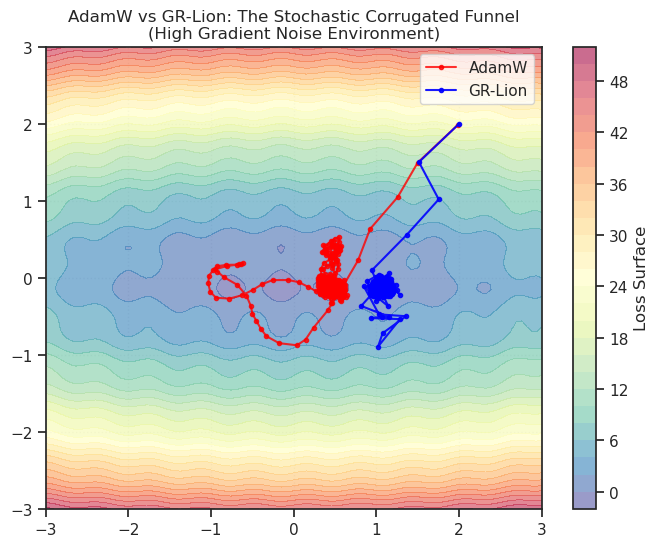

In [5]:
x = np.linspace(-3, 3, 100)
y = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x, y)
# Static background loss (no noise)
Z = 0.5 * X**2 + 5.0 * Y**2 + 0.5 * np.sin(10 * X) + 0.5 * np.sin(10 * Y)

plt.figure(figsize=(8, 6))
plt.contourf(X, Y, Z, levels=30, cmap='Spectral_r', alpha=0.6)
plt.colorbar(label="Loss Surface")

plt.plot(traj_adam[:, 0], traj_adam[:, 1], 'o-', color='red', label='AdamW', markersize=3, alpha=0.8)
plt.plot(traj_gr[:, 0], traj_gr[:, 1], 'o-', color='blue', label='GR-Lion', markersize=3, alpha=0.9)

plt.title("AdamW vs GR-Lion: The Stochastic Corrugated Funnel\n(High Gradient Noise Environment)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

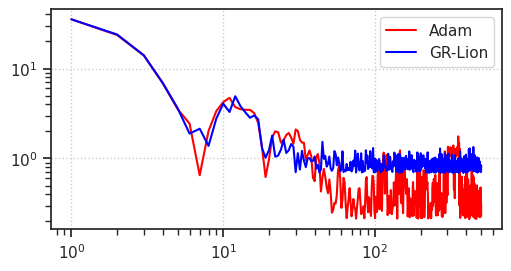

In [6]:
steps = np.arange(len(loss_gr)) + 1

fig, ax = create_figure(1, 1, (5, 2.6))
ax.plot(steps, loss_adam, color='red', label='Adam')
ax.plot(steps, loss_gr, color='blue', label='GR-Lion')
ax.set(xscale='log', yscale='log')
ax.legend()
ax.grid()
plt.show()

## Claude

### functions

In [7]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# =============================================================================
# Loss Factory
# =============================================================================

def get_loss_fn(ripple_freq=10, ripple_amp=0.5):
    """
    Returns a functional loss_fn(x, y).
    
    The function is mathematically constructed such that (0,0) is the 
    strict global minimum with a value of 0.0, regardless of parameters.

    Args:
        ripple_freq (float): Frequency of the cosine waves.
        ripple_amp (float): Amplitude scaling of the bumps.
    """
    
    def _loss_fn(x, y):
        # 1. The convex bowl (Guarantees global structure)
        corridor = 25 * y**2
        slope = 0.5 * x**2
        
        # 2. The Ripples (chaotic texture)
        # We use (1 - cos*cos) which oscillates between 0 and 2.
        # This creates "bumps" on the surface rather than "holes" in it.
        # Because this term is always >= 0, it cannot create a minimum deeper than the origin.
        distance_sq = x**2 + y**2
        ripple_envelope = torch.exp(-distance_sq / 2.0)
        
        # At (0,0), cos(0)=1, so (1 - 1*1) = 0. 
        # Everywhere else, this adds positive "friction" or bumps.
        ripples = ripple_amp * ripple_envelope * (1.0 - torch.cos(ripple_freq * x) * torch.cos(ripple_freq * y))
        
        return corridor + slope + ripples
        
    return _loss_fn


# =============================================================================
# Experiment Runner
# =============================================================================

def run_optimizer(optimizer_class, optimizer_kwargs, start, loss_fn, n_steps=800):
    """Run optimization, return trajectory and losses."""
    x = torch.tensor([start[0]], requires_grad=True, dtype=torch.float32)
    y = torch.tensor([start[1]], requires_grad=True, dtype=torch.float32)
    
    optimizer = optimizer_class([x, y], **optimizer_kwargs)
    
    trajectory = [(x.item(), y.item())]
    losses = [loss_fn(x, y).item()]
    
    for _ in range(n_steps):
        optimizer.zero_grad()
        loss = loss_fn(x, y)
        loss.backward()
        optimizer.step()
        
        trajectory.append((x.item(), y.item()))
        losses.append(loss_fn(x, y).item())
    
    return np.array(trajectory), np.array(losses)


def run_experiment(lr=0.1, n_steps=1000):
    """Main experiment comparing GR-Lion vs AdamW."""
    
    # ===================
    # CONSTRUCT LOSS
    # ===================
    # We slightly increased amp because (1-cos*cos) is softer than raw sin*sin
    loss_f = get_loss_fn(ripple_freq=10, ripple_amp=0.5)
    
    # ===================
    # HYPERPARAMETERS
    # ===================
    
    START = (3.0, 0.5)
    
    adamw_kwargs = {
        'lr': lr,
        'betas': (0.9, 0.99),
        'weight_decay': 0.0,
    }
    
    grlion_kwargs = {
        'lr': lr,
        'betas': (0.95, 0.99),
        'weight_decay': 0.0,
        'mass': 0.1,
        'kappa': 0.1,
        'beta_gravity': 0.99,
    }
    
    # ===================
    # RUN OPTIMIZERS
    # ===================
    
    print("Running AdamW...")
    traj_adam, loss_adam = run_optimizer(
        torch.optim.AdamW, adamw_kwargs, START, loss_f, n_steps
    )
    
    print("Running GR-Lion...")
    # NOTE: Ensure class GeneralRelativisticLion is defined in your scope
    traj_grlion, loss_grlion = run_optimizer(
        GeneralRelativisticLion, grlion_kwargs, START, loss_f, n_steps
    )
    
    print_stats(traj_adam, loss_adam, traj_grlion, loss_grlion)
    plot_results(traj_adam, loss_adam, traj_grlion, loss_grlion, START, loss_f)
    
    return traj_adam, loss_adam, traj_grlion, loss_grlion


# =============================================================================
# Visualization
# =============================================================================

def plot_results(traj_adam, loss_adam, traj_grlion, loss_grlion, start, loss_fn):
    """Generate comparison plots using the passed loss_fn."""
    
    fig = plt.figure(figsize=(16, 12))
    
    # --- Contour + Trajectories ---
    ax1 = fig.add_subplot(2, 2, 1)
    
    x_range = np.linspace(-4, 4, 400)
    y_range = np.linspace(-1.5, 1.5, 300)
    X, Y = np.meshgrid(x_range, y_range)
    
    tX = torch.from_numpy(X).float()
    tY = torch.from_numpy(Y).float()
    
    Z = loss_fn(tX, tY).detach().numpy()
    Z_log = np.log10(Z + 1)
    
    contour = ax1.contourf(X, Y, Z_log, levels=50, cmap='Spectral_r', alpha=0.8)
    ax1.contour(X, Y, Z_log, levels=20, colors='white', alpha=0.3, linewidths=0.5)
    
    ax1.plot(traj_adam[:, 0], traj_adam[:, 1], 'r-', lw=2, label='AdamW', alpha=0.8)
    ax1.plot(traj_grlion[:, 0], traj_grlion[:, 1], 'blue', lw=2, label='GR-Lion', alpha=0.8)
    
    ax1.scatter(*start, c='white', s=100, marker='o', edgecolors='black', zorder=5, label='Start')
    ax1.scatter(0, 0, c='yellow', s=150, marker='*', edgecolors='black', zorder=5, label='Global Min (0,0)')
    
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_title('Optimization Trajectories')
    ax1.legend(loc='upper right')
    plt.colorbar(contour, ax=ax1, label='log₁₀(Loss + 1)')
    
    # --- Loss Curves ---
    ax2 = fig.add_subplot(2, 2, 2)
    steps = np.arange(len(loss_adam))
    ax2.semilogy(steps, loss_adam, 'r-', lw=2, label='AdamW', alpha=0.8)
    ax2.semilogy(steps, loss_grlion, 'blue', lw=2, label='GR-Lion', alpha=0.8)
    ax2.set_xlabel('Step')
    ax2.set_ylabel('Loss (log scale)')
    ax2.set_title('Convergence')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # --- Zoomed Ripple Region ---
    ax3 = fig.add_subplot(2, 2, 3)
    
    x_zoom = np.linspace(-0.8, 0.8, 300)
    y_zoom = np.linspace(-0.4, 0.4, 200)
    X_z, Y_z = np.meshgrid(x_zoom, y_zoom)
    
    tX_z = torch.from_numpy(X_z).float()
    tY_z = torch.from_numpy(Y_z).float()
    Z_z = loss_fn(tX_z, tY_z).detach().numpy()
    
    contour_z = ax3.contourf(X_z, Y_z, Z_z, levels=50, cmap='Spectral_r', alpha=0.8)
    ax3.contour(X_z, Y_z, Z_z, levels=30, colors='white', alpha=0.3, linewidths=0.5)
    
    # Filter to zoom region
    for traj, color, label in [(traj_adam, 'red', 'AdamW'), (traj_grlion, 'blue', 'GR-Lion')]:
        mask = (np.abs(traj[:, 0]) < 0.8) & (np.abs(traj[:, 1]) < 0.4)
        if mask.any():
            ax3.plot(traj[mask, 0], traj[mask, 1], color=color, lw=2, label=label, alpha=0.8)
            ax3.scatter(traj[mask, 0][::10], traj[mask, 1][::10], c=color, s=20, alpha=0.6)
    
    ax3.scatter(0, 0, c='yellow', s=150, marker='*', edgecolors='black', zorder=5)
    ax3.set_xlabel('x')
    ax3.set_ylabel('y')
    ax3.set_title('Zoomed: Ripple Region')
    ax3.legend()
    plt.colorbar(contour_z, ax=ax3, label='Loss')
    
    # --- Distance to Origin ---
    ax4 = fig.add_subplot(2, 2, 4)
    dist_adam = np.linalg.norm(traj_adam, axis=1)
    dist_grlion = np.linalg.norm(traj_grlion, axis=1)
    ax4.semilogy(steps, dist_adam, 'r-', lw=2, label='AdamW', alpha=0.8)
    ax4.semilogy(steps, dist_grlion, 'blue', lw=2, label='GR-Lion', alpha=0.8)
    ax4.set_xlabel('Step')
    ax4.set_ylabel('Distance to Origin (log)')
    ax4.set_title('Convergence to Origin')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    # plt.savefig('gr_lion_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # --- 3D Surface ---
    fig2 = plt.figure(figsize=(12, 8))
    ax_3d = fig2.add_subplot(111, projection='3d')
    
    x_3d = np.linspace(-0.5, 3.5, 200)
    y_3d = np.linspace(-1, 1, 150)
    X_3d, Y_3d = np.meshgrid(x_3d, y_3d)
    
    tX_3d = torch.from_numpy(X_3d).float()
    tY_3d = torch.from_numpy(Y_3d).float()
    Z_3d = np.clip(loss_fn(tX_3d, tY_3d).detach().numpy(), 0, 30)
    
    ax_3d.plot_surface(X_3d, Y_3d, Z_3d, cmap='Spectral_r', alpha=0.7, linewidth=0, antialiased=True)
    
    t_traj_adam = torch.from_numpy(traj_adam).float()
    z_adam = loss_fn(t_traj_adam[:, 0], t_traj_adam[:, 1]).detach().numpy()
    z_adam = np.clip(z_adam, 0, 30)
    
    t_traj_grlion = torch.from_numpy(traj_grlion).float()
    z_grlion = loss_fn(t_traj_grlion[:, 0], t_traj_grlion[:, 1]).detach().numpy()
    z_grlion = np.clip(z_grlion, 0, 30)
    
    ax_3d.plot(traj_adam[:, 0], traj_adam[:, 1], z_adam, 'r-', lw=2, label='AdamW')
    ax_3d.plot(traj_grlion[:, 0], traj_grlion[:, 1], z_grlion, 'blue', lw=2, label='GR-Lion')
    
    ax_3d.set_xlabel('x')
    ax_3d.set_ylabel('y')
    ax_3d.set_zlabel('Loss')
    ax_3d.set_title('3D Loss Landscape')
    ax_3d.legend()
    ax_3d.view_init(elev=35, azim=-60)
    
    # plt.savefig('gr_lion_3d.png', dpi=150, bbox_inches='tight')
    plt.show()


def print_stats(traj_adam, loss_adam, traj_grlion, loss_grlion):
    """Print comparison statistics."""
    print("\n" + "="*50)
    print("RESULTS")
    print("="*50)
    
    print(f"\nFinal Loss:  AdamW={loss_adam[-1]:.6f}  GR-Lion={loss_grlion[-1]:.6f}")
    print(f"Final Dist:  AdamW={np.linalg.norm(traj_adam[-1]):.4f}  GR-Lion={np.linalg.norm(traj_grlion[-1]):.4f}")
    
    for thresh in [1.0, 0.5, 0.1, 0.05, 0.01, 0.001]:
        adam_steps = np.argmax(loss_adam < thresh) if (loss_adam < thresh).any() else len(loss_adam)
        grlion_steps = np.argmax(loss_grlion < thresh) if (loss_grlion < thresh).any() else len(loss_grlion)
        print(f"Steps to loss < {thresh}:  AdamW={adam_steps}  GR-Lion={grlion_steps}")

### run experiment

Running AdamW...

Running GR-Lion...

==================================================

RESULTS

==================================================

Final Loss:  AdamW=0.194501  GR-Lion=0.000960

Final Dist:  AdamW=0.6220  GR-Lion=0.0050

Steps to loss < 1.0:  AdamW=18  GR-Lion=17

Steps to loss < 0.5:  AdamW=29  GR-Lion=23

Steps to loss < 0.1:  AdamW=2001  GR-Lion=33

Steps to loss < 0.05:  AdamW=2001  GR-Lion=33

Steps to loss < 0.01:  AdamW=2001  GR-Lion=42

Steps to loss < 0.001:  AdamW=2001  GR-Lion=44

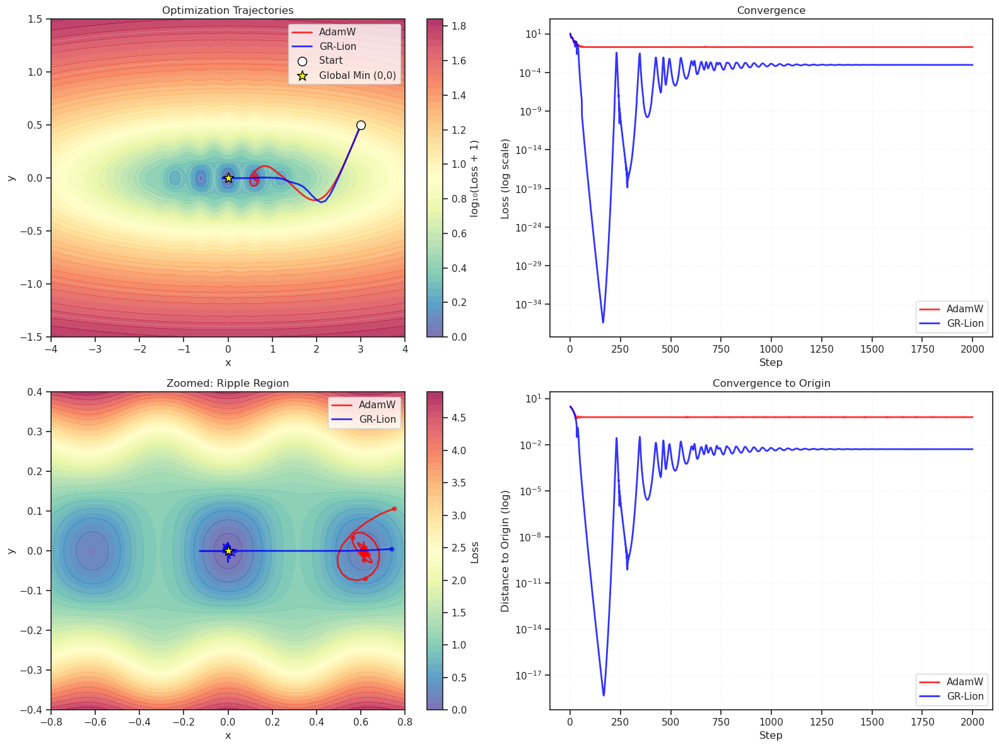

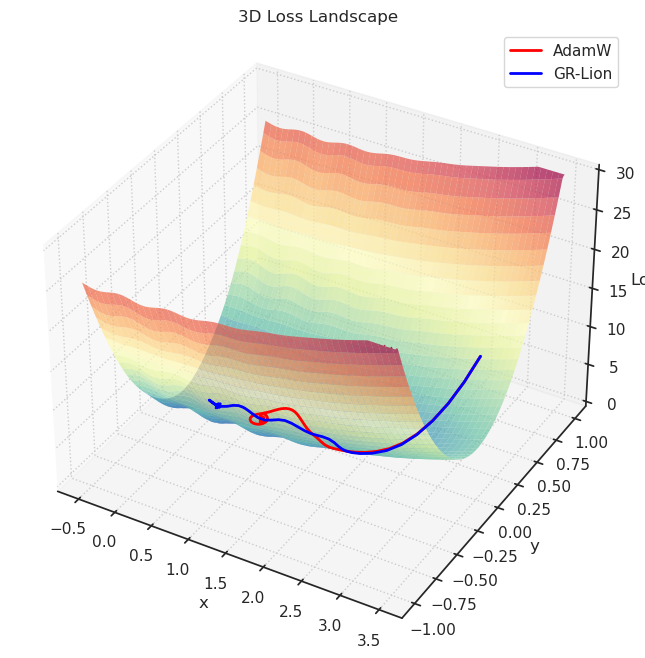

In [8]:
traj_adam, loss_adam, traj_grlion, loss_grlion = run_experiment(lr=0.1, n_steps=2000)

In [9]:
loss_fn = get_loss_fn()
loss_fn(torch.tensor(0.0), torch.tensor(0.0))

tensor(0.)

Running AdamW...

Running GR-Lion...

==================================================

RESULTS

==================================================

Final Loss:  AdamW=0.757540  GR-Lion=0.000010

Final Dist:  AdamW=1.2061  GR-Lion=0.0005

Steps to loss < 1.0:  AdamW=223  GR-Lion=165

Steps to loss < 0.5:  AdamW=3001  GR-Lion=226

Steps to loss < 0.1:  AdamW=3001  GR-Lion=295

Steps to loss < 0.05:  AdamW=3001  GR-Lion=297

Steps to loss < 0.01:  AdamW=3001  GR-Lion=299

Steps to loss < 0.001:  AdamW=3001  GR-Lion=300

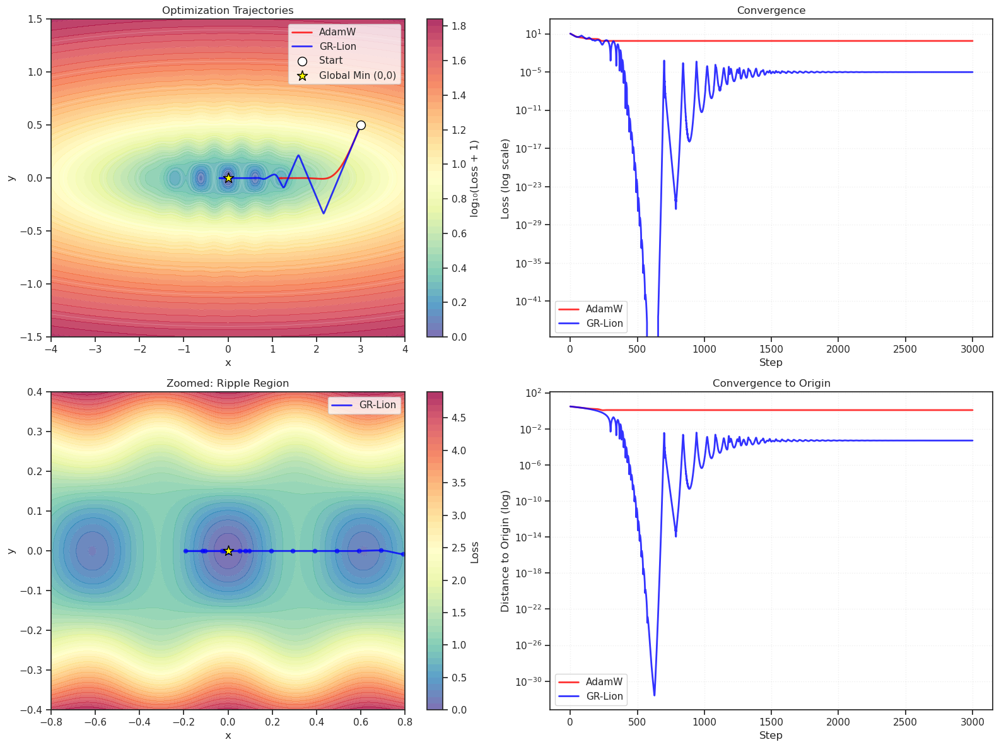

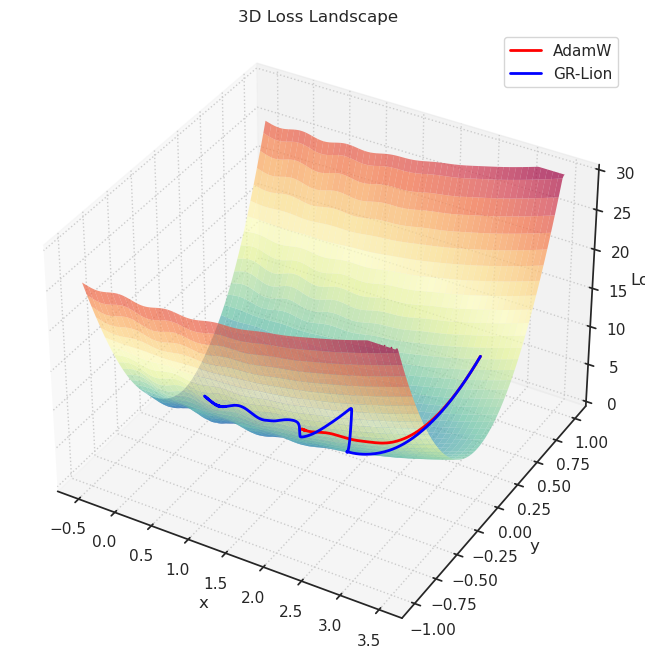

In [10]:
traj_adam, loss_adam, traj_grlion, loss_grlion = run_experiment(lr=0.01, n_steps=3000)

## Claude: noisy gradients

In [196]:
"""
Test 2: Stochastic Gradient Robustness

Hypothesis: GR-Lion detects gradient noise as shock, increases mass,
and becomes more conservative—leading to more stable convergence.

Design:
- Simple convex landscape (quadratic) for clean comparison
- Inject controlled noise: g_noisy = g_true + σ * N(0,1)
- Test multiple noise levels
- Compare: final loss, variance of final position, trajectory stability
"""

# =============================================================================
# Landscape: Simple Quadratic (convex)
# =============================================================================

def loss_fn(x, y):
    """
    Anisotropic quadratic: different curvature in x vs y.
    Minimum at (0, 0).
    """
    return 0.5 * x**2 + 5.0 * y**2


def loss_fn_np(x, y):
    return 0.5 * x**2 + 5.0 * y**2


# =============================================================================
# Noisy Optimization Runner
# =============================================================================

def run_with_noise(optimizer_class, optimizer_kwargs, start, noise_std, n_steps=1000, seed=None):
    """Run optimization with noisy gradients."""
    if seed is not None:
        torch.manual_seed(seed)
        np.random.seed(seed)
    
    x = torch.tensor([start[0]], requires_grad=True, dtype=torch.float32)
    y = torch.tensor([start[1]], requires_grad=True, dtype=torch.float32)
    
    optimizer = optimizer_class([x, y], **optimizer_kwargs)
    
    trajectory = [(x.item(), y.item())]
    losses = [loss_fn(x, y).item()]
    
    for _ in range(n_steps):
        optimizer.zero_grad()
        loss = loss_fn(x, y)
        loss.backward()
        
        # Inject noise into gradients
        if noise_std > 0:
            x.grad.add_(torch.randn_like(x.grad) * noise_std)
            y.grad.add_(torch.randn_like(y.grad) * noise_std)
        
        optimizer.step()
        
        trajectory.append((x.item(), y.item()))
        losses.append(loss_fn(x, y).item())
    
    return np.array(trajectory), np.array(losses)


def run_noise_experiment(noise_levels, n_runs=50, n_steps=1000):
    """Run experiment across multiple noise levels."""
    
    # ===================
    # HYPERPARAMETERS
    # ===================
    
    START = (3.0, 1.0)
    LR = 0.02
    
    adamw_kwargs = {
        'lr': LR,
        'betas': (0.9, 0.999),
        'weight_decay': 0.0,
    }
    
    grlion_kwargs = {
        'lr': LR,
        'betas': (0.9, 0.9),
        'weight_decay': 0.0,
        'mass': 0.01,
        'kappa': 2.0,
        'beta_gravity': 0.999,
    }
    
    results = {
        'adamw': defaultdict(list),
        'grlion': defaultdict(list),
    }
    
    all_trajectories = {
        'adamw': defaultdict(list),
        'grlion': defaultdict(list),
    }
    
    for noise_std in noise_levels:
        print(f"\nNoise σ = {noise_std}")
        
        for run in range(n_runs):
            seed = 1000 * int(noise_std * 100) + run  # Reproducible but different per run
            
            # AdamW
            traj, losses = run_with_noise(
                torch.optim.AdamW, adamw_kwargs, START, noise_std, n_steps, seed
            )
            results['adamw'][noise_std].append({
                'final_loss': losses[-1],
                'final_pos': traj[-1],
                'trajectory': traj,
                'losses': losses,
            })
            all_trajectories['adamw'][noise_std].append(traj)
            
            # GR-Lion (same seed for fair comparison)
            traj, losses = run_with_noise(
                GeneralRelativisticLion, grlion_kwargs, START, noise_std, n_steps, seed
            )
            results['grlion'][noise_std].append({
                'final_loss': losses[-1],
                'final_pos': traj[-1],
                'trajectory': traj,
                'losses': losses,
            })
            all_trajectories['grlion'][noise_std].append(traj)
    
    return results, all_trajectories, START


# =============================================================================
# Analysis
# =============================================================================

def analyze_noise_results(results, noise_levels):
    """Compute statistics across noise levels."""
    
    print("\n" + "="*70)
    print("STOCHASTIC GRADIENT RESULTS")
    print("="*70)
    
    stats = {'adamw': {}, 'grlion': {}}
    
    for name in ['adamw', 'grlion']:
        print(f"\n{name.upper()}:")
        print("-" * 50)
        print(f"{'Noise σ':>10} {'Mean Loss':>12} {'Std Loss':>12} {'Pos Std':>12}")
        print("-" * 50)
        
        for noise_std in noise_levels:
            runs = results[name][noise_std]
            
            final_losses = [r['final_loss'] for r in runs]
            final_positions = np.array([r['final_pos'] for r in runs])
            
            mean_loss = np.mean(final_losses)
            std_loss = np.std(final_losses)
            pos_std = np.mean(np.std(final_positions, axis=0))  # Average std in x and y
            
            stats[name][noise_std] = {
                'mean_loss': mean_loss,
                'std_loss': std_loss,
                'pos_std': pos_std,
            }
            
            print(f"{noise_std:>10.2f} {mean_loss:>12.4f} {std_loss:>12.4f} {pos_std:>12.4f}")
    
    # Comparison summary
    print("\n" + "="*70)
    print("COMPARISON (GR-Lion vs AdamW)")
    print("="*70)
    print(f"{'Noise σ':>10} {'Loss Ratio':>12} {'Stability':>15}")
    print("-" * 40)
    
    for noise_std in noise_levels:
        adam_loss = stats['adamw'][noise_std]['mean_loss']
        grlion_loss = stats['grlion'][noise_std]['mean_loss']
        
        adam_std = stats['adamw'][noise_std]['std_loss']
        grlion_std = stats['grlion'][noise_std]['std_loss']
        
        loss_ratio = grlion_loss / adam_loss if adam_loss > 0 else float('inf')
        
        if grlion_std < adam_std:
            stability = "GR-Lion more stable"
        elif grlion_std > adam_std:
            stability = "AdamW more stable"
        else:
            stability = "Similar"
        
        print(f"{noise_std:>10.2f} {loss_ratio:>12.3f} {stability:>15}")
    
    return stats


# =============================================================================
# Visualization
# =============================================================================

def plot_noise_results(results, all_trajectories, noise_levels, start):
    """Generate comprehensive visualizations."""
    
    # --- Figure 1: Trajectories at different noise levels ---
    n_noise = len(noise_levels)
    fig, axes = plt.subplots(2, n_noise, figsize=(5*n_noise, 10))
    
    # Landscape grid
    x_range = np.linspace(-1, 4, 200)
    y_range = np.linspace(-1.5, 1.5, 150)
    X, Y = np.meshgrid(x_range, y_range)
    Z = loss_fn_np(X, Y)
    
    for i, noise_std in enumerate(noise_levels):
        # AdamW (top row)
        ax = axes[0, i]
        ax.contourf(X, Y, Z, levels=30, cmap='Spectral_r', alpha=0.6)
        ax.contour(X, Y, Z, levels=15, colors='white', alpha=0.3, linewidths=0.5)
        
        for traj in all_trajectories['adamw'][noise_std][:10]:  # Show first 10
            ax.plot(traj[:, 0], traj[:, 1], 'r-', alpha=0.4, linewidth=0.8)
        
        ax.scatter(*start, c='white', s=100, marker='o', edgecolors='black', zorder=5)
        ax.scatter(0, 0, c='yellow', s=150, marker='*', edgecolors='black', zorder=5)
        ax.set_title(f'AdamW (σ={noise_std})', fontsize=12)
        ax.set_xlabel('x')
        if i == 0:
            ax.set_ylabel('y')
        
        # GR-Lion (bottom row)
        ax = axes[1, i]
        ax.contourf(X, Y, Z, levels=30, cmap='Spectral_r', alpha=0.6)
        ax.contour(X, Y, Z, levels=15, colors='white', alpha=0.3, linewidths=0.5)
        
        for traj in all_trajectories['grlion'][noise_std][:10]:
            ax.plot(traj[:, 0], traj[:, 1], 'blue', alpha=0.4, linewidth=0.8)
        
        ax.scatter(*start, c='white', s=100, marker='o', edgecolors='black', zorder=5)
        ax.scatter(0, 0, c='yellow', s=150, marker='*', edgecolors='black', zorder=5)
        ax.set_title(f'GR-Lion (σ={noise_std})', fontsize=12)
        ax.set_xlabel('x')
        if i == 0:
            ax.set_ylabel('y')
    
    plt.tight_layout()
    # plt.savefig('noise_trajectories.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # --- Figure 2: Loss curves comparison ---
    fig, axes = plt.subplots(1, n_noise, figsize=(5*n_noise, 4))
    
    for i, noise_std in enumerate(noise_levels):
        ax = axes[i] if n_noise > 1 else axes
        
        # Plot mean loss curves with confidence bands
        adam_losses = np.array([r['losses'] for r in results['adamw'][noise_std]])
        grlion_losses = np.array([r['losses'] for r in results['grlion'][noise_std]])
        
        steps = np.arange(adam_losses.shape[1])
        
        # AdamW
        mean_adam = np.mean(adam_losses, axis=0)
        std_adam = np.std(adam_losses, axis=0)
        ax.semilogy(steps, mean_adam, 'r-', linewidth=2, label='AdamW')
        ax.fill_between(steps, mean_adam - std_adam, mean_adam + std_adam, color='red', alpha=0.2)
        
        # GR-Lion
        mean_grlion = np.mean(grlion_losses, axis=0)
        std_grlion = np.std(grlion_losses, axis=0)
        ax.semilogy(steps, mean_grlion, 'blue', linewidth=2, label='GR-Lion')
        ax.fill_between(steps, mean_grlion - std_grlion, mean_grlion + std_grlion, color='blue', alpha=0.2)
        
        ax.set_xlabel('Step')
        ax.set_ylabel('Loss (log)')
        ax.set_title(f'Noise σ = {noise_std}')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    # plt.savefig('noise_loss_curves.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # --- Figure 3: Final position scatter ---
    fig, axes = plt.subplots(1, n_noise, figsize=(5*n_noise, 5))
    
    for i, noise_std in enumerate(noise_levels):
        ax = axes[i] if n_noise > 1 else axes
        
        adam_final = np.array([r['final_pos'] for r in results['adamw'][noise_std]])
        grlion_final = np.array([r['final_pos'] for r in results['grlion'][noise_std]])
        
        ax.scatter(adam_final[:, 0], adam_final[:, 1], c='red', s=40, alpha=0.6, label='AdamW')
        ax.scatter(grlion_final[:, 0], grlion_final[:, 1], c='blue', s=40, alpha=0.6, label='GR-Lion')
        ax.scatter(0, 0, c='yellow', s=200, marker='*', edgecolors='black', zorder=5, label='Minimum')
        
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.set_title(f'Final Positions (σ={noise_std})')
        ax.legend()
        ax.set_aspect('equal')
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    # plt.savefig('noise_final_positions.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # --- Figure 4: Summary statistics ---
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Mean final loss vs noise
    ax = axes[0]
    adam_means = [np.mean([r['final_loss'] for r in results['adamw'][σ]]) for σ in noise_levels]
    adam_stds = [np.std([r['final_loss'] for r in results['adamw'][σ]]) for σ in noise_levels]
    grlion_means = [np.mean([r['final_loss'] for r in results['grlion'][σ]]) for σ in noise_levels]
    grlion_stds = [np.std([r['final_loss'] for r in results['grlion'][σ]]) for σ in noise_levels]
    
    ax.errorbar(noise_levels, adam_means, yerr=adam_stds, fmt='ro-', capsize=5, linewidth=2, label='AdamW')
    ax.errorbar(noise_levels, grlion_means, yerr=grlion_stds, fmt='c^-', capsize=5, linewidth=2, label='GR-Lion')
    ax.set_xlabel('Noise σ')
    ax.set_ylabel('Final Loss (mean ± std)')
    ax.set_title('Final Loss vs Noise Level')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Position variance vs noise
    ax = axes[1]
    adam_pos_std = [np.mean(np.std([r['final_pos'] for r in results['adamw'][σ]], axis=0)) for σ in noise_levels]
    grlion_pos_std = [np.mean(np.std([r['final_pos'] for r in results['grlion'][σ]], axis=0)) for σ in noise_levels]
    
    ax.plot(noise_levels, adam_pos_std, 'ro-', linewidth=2, markersize=8, label='AdamW')
    ax.plot(noise_levels, grlion_pos_std, 'c^-', linewidth=2, markersize=8, label='GR-Lion')
    ax.set_xlabel('Noise σ')
    ax.set_ylabel('Position Std Dev')
    ax.set_title('Convergence Stability vs Noise Level')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    # plt.savefig('noise_summary_stats.png', dpi=150, bbox_inches='tight')
    plt.show()

==================================================

TEST 2: Stochastic Gradient Robustness

==================================================

Noise levels: [0.0, 0.1, 0.5, 1.0, 2.0, 3.0, 5.0, 10.0]

Runs per level: 100

Steps per run: 1500

Noise σ = 0.0

Noise σ = 0.1

Noise σ = 0.5

Noise σ = 1.0

Noise σ = 2.0

Noise σ = 3.0

Noise σ = 5.0

Noise σ = 10.0

======================================================================

STOCHASTIC GRADIENT RESULTS

======================================================================

ADAMW:

--------------------------------------------------

Noise σ    Mean Loss     Std Loss      Pos Std

--------------------------------------------------

0.00       0.0000       0.0000       0.0000

0.10       0.0002       0.0003       0.0103

0.50       0.0032       0.0033       0.0386

1.00       0.0087       0.0084       0.0620

2.00       0.0230       0.0205       0.1012

3.00       0.0303       0.0268       0.1173

5.00       0.0511       0.0485       0.1509

10.00       0.1101       0.0969       0.2161

GRLION:

--------------------------------------------------

Noise σ    Mean Loss     Std Loss      Pos Std

--------------------------------------------------

0.00       0.0000       0.0000       0.0000

0.10       0.0005       0.0006       0.0148

0.50       0.0027       0.0028       0.0338

1.00       0.0058       0.0056       0.0498

2.00       0.0134       0.0118       0.0773

3.00       0.0173       0.0158       0.0882

5.00       0.0311       0.0358       0.1183

10.00       0.0956       0.0763       0.1707

======================================================================

COMPARISON (GR-Lion vs AdamW)

======================================================================

Noise σ   Loss Ratio       Stability

----------------------------------------

0.00          inf         Similar

0.10        2.338 AdamW more stable

0.50        0.834 GR-Lion more stable

1.00        0.661 GR-Lion more stable

2.00        0.581 GR-Lion more stable

3.00        0.570 GR-Lion more stable

5.00        0.608 GR-Lion more stable

10.00        0.869 GR-Lion more stable

Generating plots...

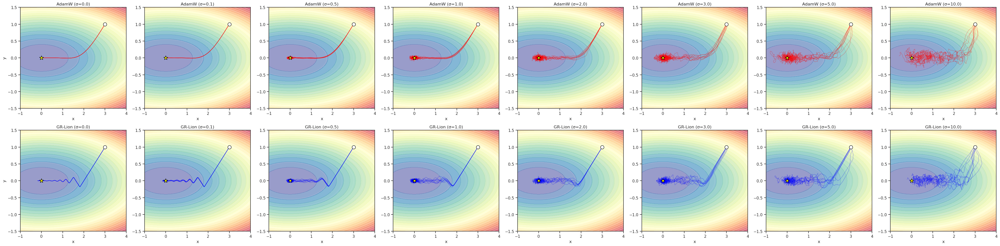

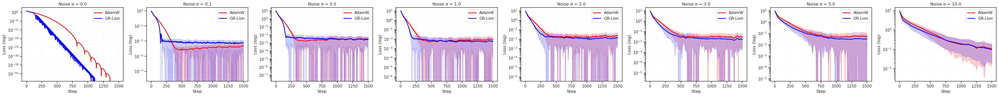

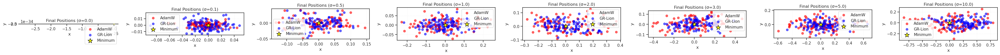

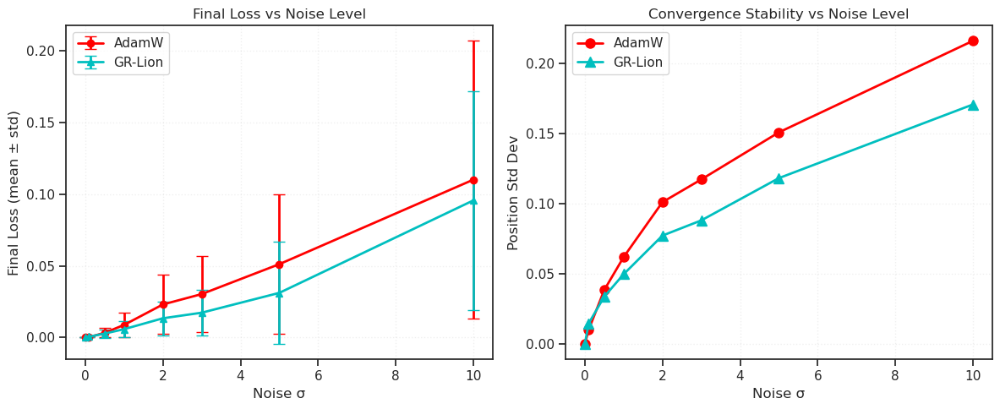

CPU times: user 11min 59s, sys: 264 ms, total: 11min 59s
Wall time: 12min


In [197]:
%%time


print("="*50)
print("TEST 2: Stochastic Gradient Robustness")
print("="*50)

# Noise levels to test
NOISE_LEVELS = [0.0, 0.1, 0.5, 1.0, 2.0, 3.0, 5.0, 10.0]
N_RUNS = 100
N_STEPS = 1500

print(f"\nNoise levels: {NOISE_LEVELS}")
print(f"Runs per level: {N_RUNS}")
print(f"Steps per run: {N_STEPS}")

results, all_trajectories, start = run_noise_experiment(
    NOISE_LEVELS, n_runs=N_RUNS, n_steps=N_STEPS
)

stats = analyze_noise_results(results, NOISE_LEVELS)

print("\nGenerating plots...")
plot_noise_results(results, all_trajectories, NOISE_LEVELS, start)

==================================================

TEST 2: Stochastic Gradient Robustness

==================================================

Noise levels: [0.0, 0.1, 0.5, 1.0, 2.0, 3.0, 5.0, 10.0]

Runs per level: 100

Steps per run: 1200

Noise σ = 0.0

Noise σ = 0.1

Noise σ = 0.5

Noise σ = 1.0

Noise σ = 2.0

Noise σ = 3.0

Noise σ = 5.0

Noise σ = 10.0

======================================================================

STOCHASTIC GRADIENT RESULTS

======================================================================

ADAMW:

--------------------------------------------------

Noise σ    Mean Loss     Std Loss      Pos Std

--------------------------------------------------

0.00       0.0000       0.0000       0.0000

0.10       0.0002       0.0002       0.0087

0.50       0.0032       0.0030       0.0391

1.00       0.0082       0.0094       0.0606

2.00       0.0185       0.0184       0.0894

3.00       0.0301       0.0299       0.1119

5.00       0.0479       0.0480       0.1438

10.00       0.1415       0.1243       0.2120

GRLION:

--------------------------------------------------

Noise σ    Mean Loss     Std Loss      Pos Std

--------------------------------------------------

0.00       0.0000       0.0000       0.0000

0.10       0.0003       0.0003       0.0122

0.50       0.0021       0.0022       0.0322

1.00       0.0050       0.0048       0.0469

2.00       0.0094       0.0098       0.0638

3.00       0.0199       0.0192       0.0929

5.00       0.0282       0.0256       0.1115

10.00       0.1337       0.1047       0.1855

======================================================================

COMPARISON (GR-Lion vs AdamW)

======================================================================

Noise σ   Loss Ratio       Stability

----------------------------------------

0.00 4237589940715.673         Similar

0.10        1.873 AdamW more stable

0.50        0.657 GR-Lion more stable

1.00        0.606 GR-Lion more stable

2.00        0.506 GR-Lion more stable

3.00        0.663 GR-Lion more stable

5.00        0.589 GR-Lion more stable

10.00        0.944 GR-Lion more stable

Generating plots...

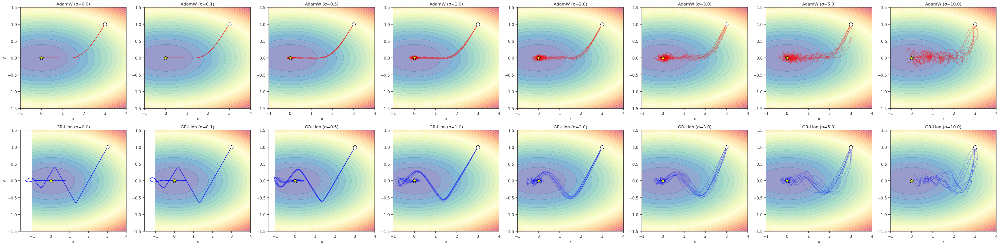

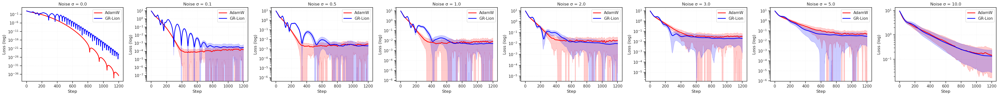

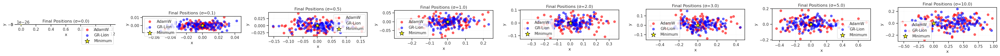

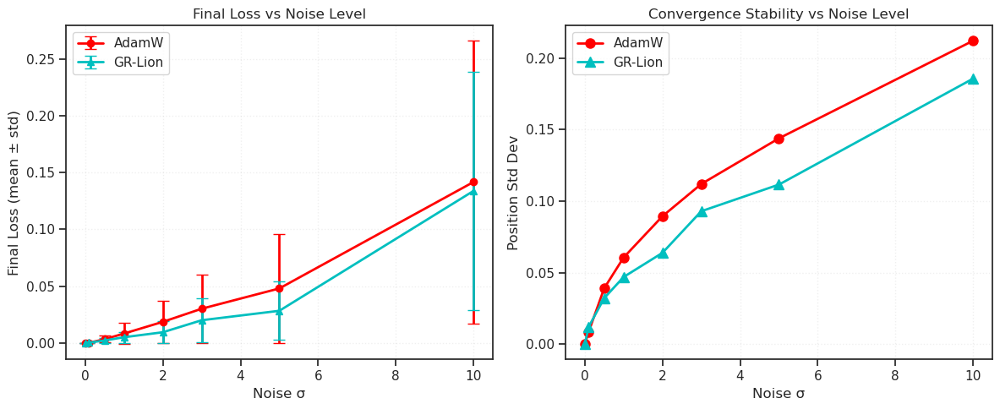

CPU times: user 9min 43s, sys: 313 ms, total: 9min 43s
Wall time: 9min 44s


In [54]:
## Was:

# 'lr': 0.02
# 'mass': 0.001,
# 'kappa': 2.0,

==================================================

TEST 2: Stochastic Gradient Robustness

==================================================

Noise levels: [0.0, 0.1, 0.5, 1.0, 2.0, 3.0, 5.0, 10.0]

Runs per level: 100

Steps per run: 1200

Noise σ = 0.0

Noise σ = 0.1

Noise σ = 0.5

Noise σ = 1.0

Noise σ = 2.0

Noise σ = 3.0

Noise σ = 5.0

Noise σ = 10.0

======================================================================

STOCHASTIC GRADIENT RESULTS

======================================================================

ADAMW:

--------------------------------------------------

Noise σ    Mean Loss     Std Loss      Pos Std

--------------------------------------------------

0.00       0.0000       0.0000       0.0000

0.10       0.0000       0.0000       0.0047

0.50       0.0011       0.0011       0.0223

1.00       0.0035       0.0041       0.0391

2.00       0.0091       0.0096       0.0612

3.00       0.0198       0.0183       0.0778

5.00       0.0648       0.0500       0.0996

10.00       0.4808       0.2027       0.1465

GRLION:

--------------------------------------------------

Noise σ    Mean Loss     Std Loss      Pos Std

--------------------------------------------------

0.00       0.0000       0.0000       0.0000

0.10       0.0004       0.0005       0.0154

0.50       0.0035       0.0034       0.0417

1.00       0.0086       0.0099       0.0640

2.00       0.0187       0.0179       0.0936

3.00       0.0404       0.0436       0.1328

5.00       0.0606       0.0610       0.1627

10.00       0.1508       0.1459       0.2625

======================================================================

COMPARISON (GR-Lion vs AdamW)

======================================================================

Noise σ   Loss Ratio       Stability

----------------------------------------

0.00        0.000         Similar

0.10        9.632 AdamW more stable

0.50        3.221 AdamW more stable

1.00        2.429 AdamW more stable

2.00        2.055 AdamW more stable

3.00        2.034 AdamW more stable

5.00        0.935 AdamW more stable

10.00        0.314 GR-Lion more stable

Generating plots...

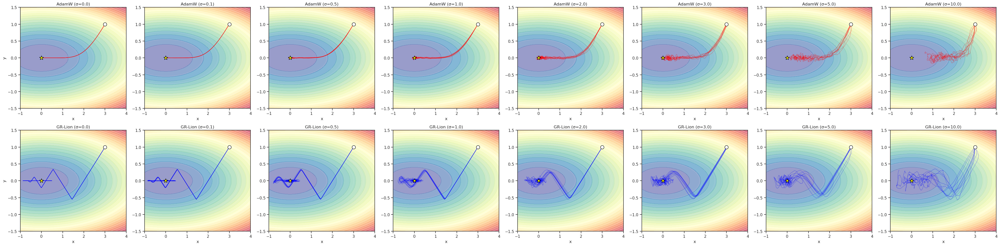

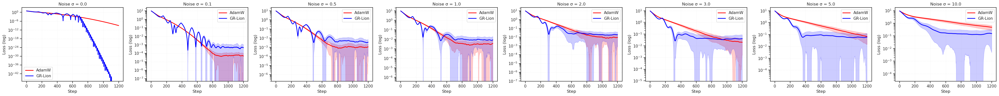

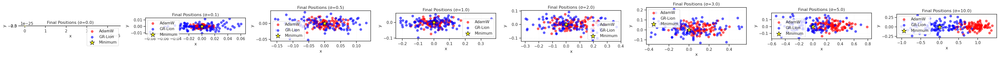

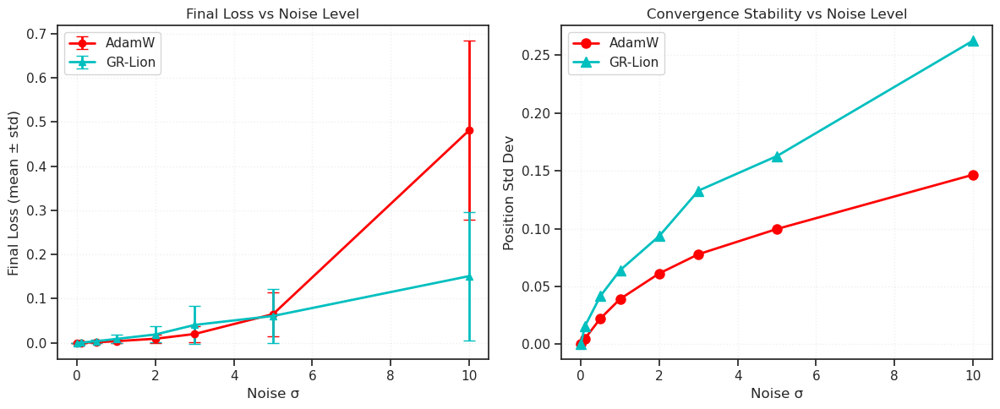

CPU times: user 9min 38s, sys: 258 ms, total: 9min 38s
Wall time: 9min 39s


In [44]:
## Was: mass = 0.01, kappa = 0.1

==================================================

TEST 2: Stochastic Gradient Robustness

==================================================

Noise levels: [0.0, 0.1, 0.5, 1.0, 2.0, 3.0, 5.0, 10.0]

Runs per level: 100

Steps per run: 1200

Noise σ = 0.0

Noise σ = 0.1

Noise σ = 0.5

Noise σ = 1.0

Noise σ = 2.0

Noise σ = 3.0

Noise σ = 5.0

Noise σ = 10.0

======================================================================

STOCHASTIC GRADIENT RESULTS

======================================================================

ADAMW:

--------------------------------------------------

Noise σ    Mean Loss     Std Loss      Pos Std

--------------------------------------------------

0.00       0.0000       0.0000       0.0000

0.10       0.0000       0.0000       0.0047

0.50       0.0011       0.0011       0.0223

1.00       0.0035       0.0041       0.0391

2.00       0.0091       0.0096       0.0612

3.00       0.0198       0.0183       0.0778

5.00       0.0648       0.0500       0.0996

10.00       0.4808       0.2027       0.1465

GRLION:

--------------------------------------------------

Noise σ    Mean Loss     Std Loss      Pos Std

--------------------------------------------------

0.00       0.0000       0.0000       0.0000

0.10       0.0002       0.0002       0.0104

0.50       0.0016       0.0016       0.0268

1.00       0.0040       0.0040       0.0408

2.00       0.0072       0.0080       0.0554

3.00       0.0142       0.0126       0.0779

5.00       0.0278       0.0257       0.0956

10.00       0.3214       0.1679       0.1516

======================================================================

COMPARISON (GR-Lion vs AdamW)

======================================================================

Noise σ   Loss Ratio       Stability

----------------------------------------

0.00        0.000         Similar

0.10        4.478 AdamW more stable

0.50        1.471 AdamW more stable

1.00        1.117 GR-Lion more stable

2.00        0.786 GR-Lion more stable

3.00        0.717 GR-Lion more stable

5.00        0.430 GR-Lion more stable

10.00        0.668 GR-Lion more stable

Generating plots...

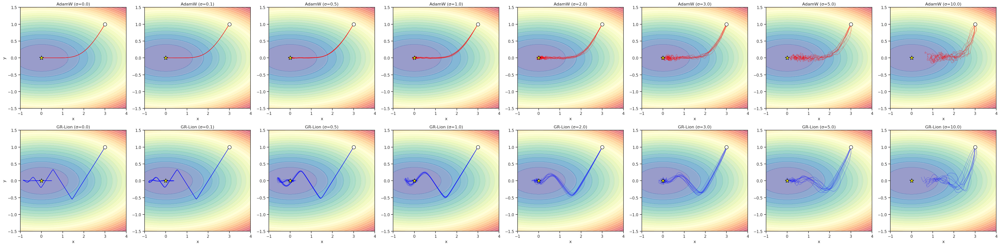

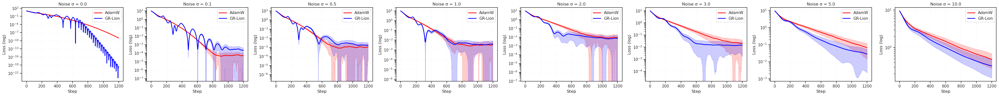

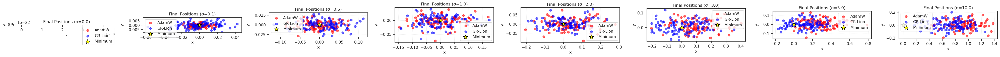

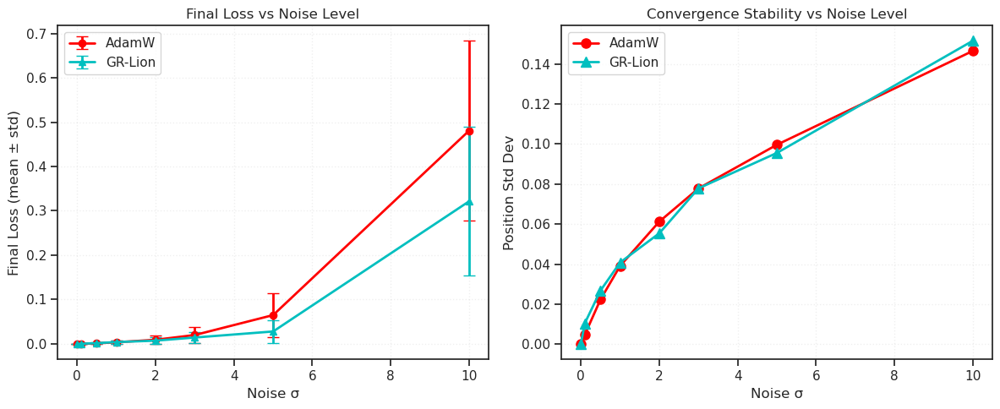

CPU times: user 9min 39s, sys: 375 ms, total: 9min 40s
Wall time: 9min 40s


In [42]:
## Was: mass = 0.01, kappa = 1.0

## Gemini: additional stuff

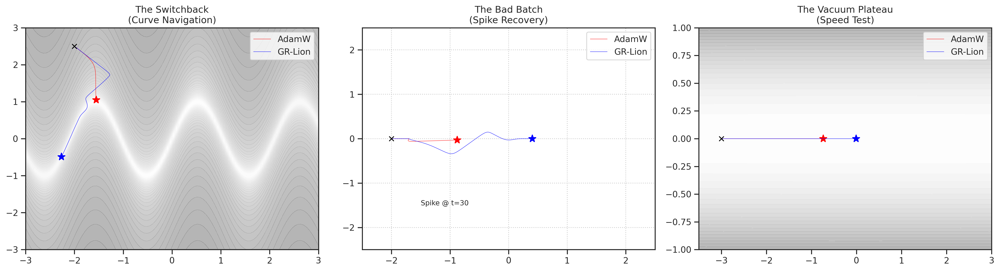

In [77]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.optim import AdamW


def get_optimizer(name, params):
    if name == "AdamW":
        return AdamW(params, lr=0.01, betas=(0.9, 0.999)) # Standard AdamW
    elif name == "GR-Lion":
        # Note: Slightly lower beta_gravity for faster recovery
        return GeneralRelativisticLion(params, lr=0.01, mass=1e-5, kappa=2.0, beta_gravity=0.90) 


def run_test(test_name, steps=300):
    trajectories = {}
    
    for optim_name in ["AdamW", "GR-Lion"]:
        # Start point differs per test to maximize visibility of effect
        if test_name == "Switchback":
            params = torch.tensor([-2.0, 2.5], requires_grad=True)
        elif test_name == "BadBatch":
            params = torch.tensor([-2.0, 0.0], requires_grad=True)
        elif test_name == "Plateau":
            params = torch.tensor([-3.0, 0.0], requires_grad=True)
            
        opt = get_optimizer(optim_name, [params])
        path = []

        for t in range(steps):
            opt.zero_grad()
            
            x, y = params[0], params[1]
            path.append((x.item(), y.item()))
            
            # --- SCENARIO 1: The Switchback Valley ---
            if test_name == "Switchback":
                # A narrow valley that follows a sine wave
                target_y = torch.sin(x * 3.0)
                # Steep walls (100x penalty), gentle drift along X
                loss = 100 * (y - target_y)**2 + 0.1 * x**2 

            # --- SCENARIO 2: The Bad Batch Spike ---
            elif test_name == "BadBatch":
                # Simple bowl
                loss = x**2 + y**2
                loss.backward()
                
                # At step 30, inject a massive gradient spike (Bad Batch)
                if t == 30:
                    with torch.no_grad():
                        params.grad.add_(torch.tensor([100.0, 100.0]))
                
                # Skip normal backward for the rest of this block to keep logic clean
                opt.step()
                continue 

            # --- SCENARIO 3: The Vacuum Plateau ---
            elif test_name == "Plateau":
                # Extremely flat gradient in X direction
                loss = 0.0001 * x**2 + y**2

            loss.backward()
            opt.step()
            
        trajectories[optim_name] = np.array(path)
    return trajectories

# -----------------------------------------------------------
# Visualization
# -----------------------------------------------------------
tests = ["Switchback", "BadBatch", "Plateau"]
fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=300)

for ax, test in zip(axes, tests):
    paths = run_test(test)
    
    # Plot Background (Approximate)
    if test == "Switchback":
        x = np.linspace(-3, 3, 100)
        y = np.linspace(-3, 3, 100)
        X, Y = np.meshgrid(x, y)
        Z = 100 * (Y - np.sin(X * 3.0))**2 + 0.1 * X**2
        ax.contourf(X, Y, np.log(Z + 1), levels=30, cmap='gray_r', alpha=0.3)
        ax.set_title("The Switchback\n(Curve Navigation)")
        
    elif test == "BadBatch":
        ax.set_title("The Bad Batch\n(Spike Recovery)")
        ax.set_xlim(-2.5, 2.5)
        ax.set_ylim(-2.5, 2.5)
        ax.grid(True)
        # Mark the spike location
        ax.text(-1.5, -1.5, "Spike @ t=30", fontsize=9)

    elif test == "Plateau":
        x = np.linspace(-3.5, 3, 100)
        y = np.linspace(-1, 1, 100)
        X, Y = np.meshgrid(x, y)
        Z = 0.0001 * X**2 + Y**2
        ax.contourf(X, Y, Z, levels=20, cmap='gray_r', alpha=0.3)
        ax.set_title("The Vacuum Plateau\n(Speed Test)")

    # Plot Trajectories
    for name, path in paths.items():
        color = 'red' if name == "AdamW" else 'blue'
        # Plot lines
        ax.plot(path[:, 0], path[:, 1], '-', label=name, markersize=0.0, lw=0.5, alpha=0.8, color=color)
        # Mark Start/End
        ax.plot(path[0, 0], path[0, 1], 'x', color='black') # Start
        ax.plot(path[-1, 0], path[-1, 1], '*', color=color, markersize=10) # End

    ax.legend()

plt.tight_layout()
plt.show()

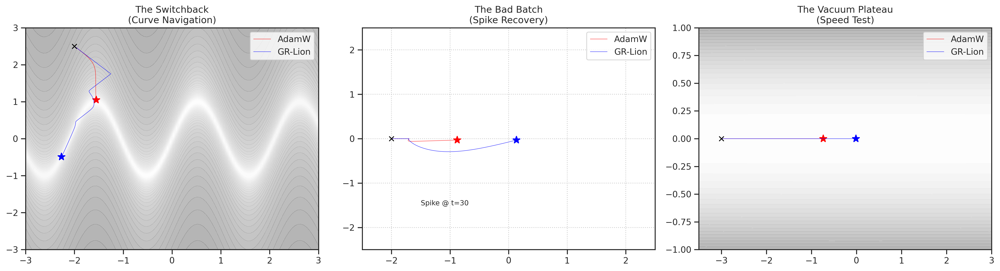

In [83]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.optim import AdamW


def get_optimizer(name, params):
    if name == "AdamW":
        return AdamW(params, lr=0.01, betas=(0.9, 0.999)) # Standard AdamW
    elif name == "GR-Lion":
        # Note: Slightly lower beta_gravity for faster recovery
        return GeneralRelativisticLion(params, lr=0.01, mass=0.1, kappa=0.1, beta_gravity=0.999) 


def run_test(test_name, steps=300):
    trajectories = {}
    
    for optim_name in ["AdamW", "GR-Lion"]:
        # Start point differs per test to maximize visibility of effect
        if test_name == "Switchback":
            params = torch.tensor([-2.0, 2.5], requires_grad=True)
        elif test_name == "BadBatch":
            params = torch.tensor([-2.0, 0.0], requires_grad=True)
        elif test_name == "Plateau":
            params = torch.tensor([-3.0, 0.0], requires_grad=True)
            
        opt = get_optimizer(optim_name, [params])
        path = []

        for t in range(steps):
            opt.zero_grad()
            
            x, y = params[0], params[1]
            path.append((x.item(), y.item()))
            
            # --- SCENARIO 1: The Switchback Valley ---
            if test_name == "Switchback":
                # A narrow valley that follows a sine wave
                target_y = torch.sin(x * 3.0)
                # Steep walls (100x penalty), gentle drift along X
                loss = 100 * (y - target_y)**2 + 0.1 * x**2 

            # --- SCENARIO 2: The Bad Batch Spike ---
            elif test_name == "BadBatch":
                # Simple bowl
                loss = x**2 + y**2
                loss.backward()
                
                # At step 30, inject a massive gradient spike (Bad Batch)
                if t == 30:
                    with torch.no_grad():
                        params.grad.add_(torch.tensor([100.0, 100.0]))
                
                # Skip normal backward for the rest of this block to keep logic clean
                opt.step()
                continue 

            # --- SCENARIO 3: The Vacuum Plateau ---
            elif test_name == "Plateau":
                # Extremely flat gradient in X direction
                loss = 0.0001 * x**2 + y**2

            loss.backward()
            opt.step()
            
        trajectories[optim_name] = np.array(path)
    return trajectories

# -----------------------------------------------------------
# Visualization
# -----------------------------------------------------------
tests = ["Switchback", "BadBatch", "Plateau"]
fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=300)

for ax, test in zip(axes, tests):
    paths = run_test(test)
    
    # Plot Background (Approximate)
    if test == "Switchback":
        x = np.linspace(-3, 3, 100)
        y = np.linspace(-3, 3, 100)
        X, Y = np.meshgrid(x, y)
        Z = 100 * (Y - np.sin(X * 3.0))**2 + 0.1 * X**2
        ax.contourf(X, Y, np.log(Z + 1), levels=30, cmap='gray_r', alpha=0.3)
        ax.set_title("The Switchback\n(Curve Navigation)")
        
    elif test == "BadBatch":
        ax.set_title("The Bad Batch\n(Spike Recovery)")
        ax.set_xlim(-2.5, 2.5)
        ax.set_ylim(-2.5, 2.5)
        ax.grid(True)
        # Mark the spike location
        ax.text(-1.5, -1.5, "Spike @ t=30", fontsize=9)

    elif test == "Plateau":
        x = np.linspace(-3.5, 3, 100)
        y = np.linspace(-1, 1, 100)
        X, Y = np.meshgrid(x, y)
        Z = 0.0001 * X**2 + Y**2
        ax.contourf(X, Y, Z, levels=20, cmap='gray_r', alpha=0.3)
        ax.set_title("The Vacuum Plateau\n(Speed Test)")

    # Plot Trajectories
    for name, path in paths.items():
        color = 'red' if name == "AdamW" else 'blue'
        # Plot lines
        ax.plot(path[:, 0], path[:, 1], '-', label=name, markersize=0.0, lw=0.5, alpha=0.8, color=color)
        # Mark Start/End
        ax.plot(path[0, 0], path[0, 1], 'x', color='black') # Start
        ax.plot(path[-1, 0], path[-1, 1], '*', color=color, markersize=10) # End

    ax.legend()

plt.tight_layout()
plt.show()

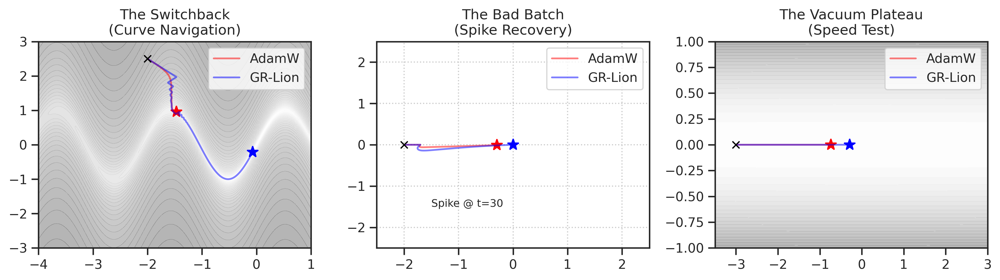

In [183]:
x_drift_strength = 1.0


def get_optimizer(name, params, lr=0.01):
    if name == "AdamW":
        return torch.optim.AdamW(params, lr=lr, betas=(0.9, 0.999)) # Standard AdamW
    elif name == "GR-Lion":
        # Note: Slightly lower beta_gravity for faster recovery
        return GeneralRelativisticLion(params, lr=lr, mass=0.1, kappa=0.1, beta_gravity=0.99, betas=(0.9, 0.9))


def run_test(test_name, steps=300):
    trajectories = {}
    
    for optim_name in ["AdamW", "GR-Lion"]:
        # Start point differs per test to maximize visibility of effect
        if test_name == "Switchback":
            params = torch.tensor([-2.0, 2.5], requires_grad=True)
        elif test_name == "BadBatch":
            params = torch.tensor([-2.0, 0.0], requires_grad=True)
        elif test_name == "Plateau":
            params = torch.tensor([-3.0, 0.0], requires_grad=True)

        opt = get_optimizer(optim_name, [params])
        path = []

        for t in range(steps):
            opt.zero_grad()
            
            x, y = params[0], params[1]
            path.append((x.item(), y.item()))
            
            # --- SCENARIO 1: The Switchback Valley ---
            if test_name == "Switchback":
                # A narrow valley that follows a sine wave
                target_y = torch.sin(x * 3.0)
                # Steep walls (100x penalty), drift along X
                loss = 100 * (y - target_y)**2 + x_drift_strength * x**2
                loss.backward()

            # --- SCENARIO 2: The Bad Batch Spike ---
            elif test_name == "BadBatch":
                # Simple bowl
                loss = x**2 + y**2
                loss.backward()
                
                # At step 30, inject a massive gradient spike (Bad Batch)
                if t == 30:
                    with torch.no_grad():
                        params.grad.add_(torch.tensor([100.0, 100.0]))

            # --- SCENARIO 3: The Vacuum Plateau ---
            elif test_name == "Plateau":
                # Extremely flat gradient in X direction
                loss = 0.0001 * x**2 + y**2
                loss.backward()


            opt.step()
            
        trajectories[optim_name] = np.array(path)
    return trajectories

# -----------------------------------------------------------
# Visualization
# -----------------------------------------------------------
tests = ["Switchback", "BadBatch", "Plateau"]
fig, axes = plt.subplots(1, 3, figsize=(12, 3.5), dpi=300)

for (ax, test) in zip(axes, tests):
    if test == 'Switchback':
        steps = 600
    elif test == 'BadBatch':
        steps = 550
    elif test == 'Plateau':
        steps = 300
    
    paths = run_test(test, steps=steps)
    
    # Plot Background (Approximate)
    if test == "Switchback":
        x = np.linspace(-4, 1, 200)
        y = np.linspace(-3, 3, 200)
        X, Y = np.meshgrid(x, y)
        Z = 100 * (Y - np.sin(X * 3.0))**2 + x_drift_strength * X**2
        ax.contourf(X, Y, np.log(Z + 1), levels=30, cmap='gray_r', alpha=0.3)
        ax.set_title("The Switchback\n(Curve Navigation)")
        
    elif test == "BadBatch":
        ax.set_title("The Bad Batch\n(Spike Recovery)")
        ax.set_xlim(-2.5, 2.5)
        ax.set_ylim(-2.5, 2.5)
        ax.grid(True)
        # Mark the spike location
        ax.text(-1.5, -1.5, "Spike @ t=30", fontsize=9)

    elif test == "Plateau":
        x = np.linspace(-3.5, 3, 100)
        y = np.linspace(-1, 1, 100)
        X, Y = np.meshgrid(x, y)
        Z = 0.0001 * X**2 + Y**2
        ax.contourf(X, Y, Z, levels=20, cmap='gray_r', alpha=0.3)
        ax.set_title("The Vacuum Plateau\n(Speed Test)")

    # Plot Trajectories
    for name, path in paths.items():
        color = 'red' if name == "AdamW" else 'blue'
        # Plot lines
        ax.plot(path[:, 0], path[:, 1], label=name, lw=1.5, alpha=0.5, color=color)
        # Mark Start/End
        ax.plot(path[0, 0], path[0, 1], 'x', color='black', markersize=6) # Start
        ax.plot(path[-1, 0], path[-1, 1], '*', color=color, markersize=10) # End

    ax.legend()

plt.tight_layout()
plt.show()

### save animation

In [171]:
import matplotlib.animation as animation
from matplotlib.colors import LogNorm


# ==========================================
# 2. Simulation Setup
# ==========================================
def get_optimizer_state(name, test_name, lr=0.01):
    # Initial Positions
    if test_name == "Switchback":
        params = torch.tensor([-2.0, 2.5], requires_grad=True)
    elif test_name == "BadBatch":
        params = torch.tensor([-2.0, 0.0], requires_grad=True)
    elif test_name == "Plateau":
        params = torch.tensor([-3.0, 0.0], requires_grad=True)

    # Optimizer Config
    if name == "AdamW":
        opt = AdamW([params], lr=lr, betas=(0.9, 0.999))
    elif name == "GR-Lion":
        # High gravity memory (beta=0.999) as discussed
        opt = GeneralRelativisticLion([params], lr=lr, mass=0.1, kappa=0.1, beta_gravity=0.99, betas=(0.9, 0.9))

    return {"params": params, "opt": opt, "traj": [], "name": name}

# ==========================================
# 3. Animation Logic
# ==========================================
def animate_dynamics(filename="gr_lion_vs_adamw.mp4", frames=350):
    tests = ["Switchback", "BadBatch", "Plateau"]
    
    # Setup Figure
    fig, axes = plt.subplots(1, 3, figsize=(12, 3.5), dpi=300)
    
    # Initialize States [Test][Optimizer]
    states = {}
    lines = {}
    heads = {} # Markers for current position
    step_texts = {} # <--- NEW: Dictionary to hold text objects
    
    # Pre-compute backgrounds and init plots
    for i, test in enumerate(tests):
        ax = axes[i]
        states[test] = [get_optimizer_state("AdamW", test), get_optimizer_state("GR-Lion", test)]
        
        # --- Background Contours ---
        if test == "Switchback":
            x = np.linspace(-4, 1, 500); y = np.linspace(-3, 3, 500)
            X, Y = np.meshgrid(x, y)
            Z = 100 * (Y - np.sin(X * 3.0))**2 + 0.1 * X**2
            ax.contourf(X, Y, np.log(Z + 1), levels=30, cmap='gray_r', alpha=0.3)
            ax.set_title("The Switchback\n(Curve Navigation)")
        elif test == "BadBatch":
            ax.set_title("The Bad Batch\n(Spike Recovery)")
            ax.set_xlim(-2.5, 2.5); ax.set_ylim(-2.5, 2.5)
            ax.grid(True, linestyle=':', alpha=0.6)
            ax.text(-2.0, 1.5, "gradient spike @ t=30", fontsize=9)
        elif test == "Plateau":
            x = np.linspace(-3.5, 1.5, 100); y = np.linspace(-1, 1, 100)
            X, Y = np.meshgrid(x, y)
            Z = 0.0001 * X**2 + Y**2
            ax.contourf(X, Y, Z, levels=20, cmap='gray_r', alpha=0.3)
            ax.set_title("The Vacuum Plateau\n(Speed Test)")

        # --- Init Lines ---
        lines[test] = []
        heads[test] = []
        for s in states[test]:
            color = 'red' if s['name'] == "AdamW" else 'blue'
            # Line history
            line, = ax.plot([], [], color=color, lw=2, alpha=0.6, label=s['name'])
            # Current head
            head, = ax.plot([], [], marker='*', color=color, markersize=12)
            lines[test].append(line)
            heads[test].append(head)
            
            # Record initial position
            s['traj'].append(s['params'].detach().numpy().copy())
        
        ax.legend(loc='lower right')

        # --- NEW: Init Step Text ---
        # transform=ax.transAxes ensures the text stays at (5%, 90%) relative to the box
        step_texts[test] = ax.text(0.05, 0.9, '', transform=ax.transAxes, fontsize=10)

    # --- Update Function ---
    def update(frame):
        for test in tests:
            # Update Step Count Text
            step_texts[test].set_text(f"Step: {frame}")
            
            for idx, s in enumerate(states[test]):
                params = s['params']
                opt = s['opt']
                
                opt.zero_grad()
                x, y = params[0], params[1]
                
                # --- Loss Calculation ---
                if test == "Switchback":
                    target_y = torch.sin(x * 3.0)
                    loss = 100 * (y - target_y)**2 + 0.1 * x**2
                    loss.backward()
                    
                elif test == "BadBatch":
                    loss = x**2 + y**2
                    loss.backward()
                    # Inject Spike at Frame 20
                    if frame == 30:
                        with torch.no_grad():
                            params.grad.add_(torch.tensor([100.0, 100.0]))

                elif test == "Plateau":
                    loss = 0.0001 * x**2 + y**2
                    loss.backward()

                opt.step()
                
                # Record
                pos = params.detach().numpy().copy()
                s['traj'].append(pos)
                
                # Update Plots
                traj = np.array(s['traj'])
                lines[test][idx].set_data(traj[:, 0], traj[:, 1])
                heads[test][idx].set_data([pos[0]], [pos[1]])
                
        return [l for sublist in lines.values() for l in sublist] + \
               [h for sublist in heads.values() for h in sublist] + \
               list(step_texts.values()) # <--- NEW: Return text artists for blitting

    # --- Generate Animation ---
    print(f"Generating animation ({frames} frames)... this may take a minute.")
    anim = animation.FuncAnimation(fig, update, frames=frames, interval=30, blit=True)
    
    # Save
    writer = animation.FFMpegWriter(fps=30, metadata=dict(artist='Me'), bitrate=1800)
    anim.save(filename, writer=writer)
    print(f"Saved to {filename}")
    plt.close()


In [172]:
%%time


save_file = tmp_dir / 'gr_lion_vs_adamw.mp4'

animate_dynamics(save_file, frames=3000)

Generating animation (3000 frames)... this may take a minute.

Saved to /home/hadi/Dropbox/git/jb-progress-2026/tmp/gr_lion_vs_adamw.mp4

CPU times: user 9min 22s, sys: 13.8 s, total: 9min 36s
Wall time: 10min 1s


### save animation (stronger x drift)

In [184]:
x_drift_strength = 1.0

In [185]:
import matplotlib.animation as animation
from matplotlib.colors import LogNorm

# ==========================================
# 2. Simulation Setup
# ==========================================
def get_optimizer_state(name, test_name, lr=0.01):
    # Initial Positions
    if test_name == "Switchback":
        params = torch.tensor([-2.0, 2.5], requires_grad=True)
    elif test_name == "BadBatch":
        params = torch.tensor([-2.0, 0.0], requires_grad=True)
    elif test_name == "Plateau":
        params = torch.tensor([-3.0, 0.0], requires_grad=True)

    # Optimizer Config
    if name == "AdamW":
        opt = AdamW([params], lr=lr, betas=(0.9, 0.999))
    elif name == "GR-Lion":
        # High gravity memory (beta=0.999) as discussed
        opt = GeneralRelativisticLion([params], lr=lr, mass=0.1, kappa=0.1, beta_gravity=0.99, betas=(0.9, 0.9))

    return {"params": params, "opt": opt, "traj": [], "name": name}

# ==========================================
# 3. Animation Logic
# ==========================================
def animate_dynamics(filename="gr_lion_vs_adamw.mp4", frames=350):
    tests = ["Switchback", "BadBatch", "Plateau"]
    
    # Setup Figure
    fig, axes = plt.subplots(1, 3, figsize=(12, 3.5), dpi=300)
    
    # Initialize States [Test][Optimizer]
    states = {}
    lines = {}
    heads = {} # Markers for current position
    step_texts = {} # <--- NEW: Dictionary to hold text objects
    
    # Pre-compute backgrounds and init plots
    for i, test in enumerate(tests):
        ax = axes[i]
        states[test] = [get_optimizer_state("AdamW", test), get_optimizer_state("GR-Lion", test)]
        
        # --- Background Contours ---
        if test == "Switchback":
            x = np.linspace(-4, 1, 500); y = np.linspace(-3, 3, 500)
            X, Y = np.meshgrid(x, y)
            Z = 100 * (Y - np.sin(X * 3.0))**2 + x_drift_strength * X**2
            ax.contourf(X, Y, np.log(Z + 1), levels=30, cmap='gray_r', alpha=0.3)
            ax.set_title("The Switchback\n(Curve Navigation)")
        elif test == "BadBatch":
            ax.set_title("The Bad Batch\n(Spike Recovery)")
            ax.set_xlim(-2.5, 2.5); ax.set_ylim(-2.5, 2.5)
            ax.grid(True, linestyle=':', alpha=0.6)
            ax.text(-2.0, 1.5, "gradient spike @ t=30", fontsize=9)
        elif test == "Plateau":
            x = np.linspace(-3.5, 1.5, 100); y = np.linspace(-1, 1, 100)
            X, Y = np.meshgrid(x, y)
            Z = 0.0001 * X**2 + Y**2
            ax.contourf(X, Y, Z, levels=20, cmap='gray_r', alpha=0.3)
            ax.set_title("The Vacuum Plateau\n(Speed Test)")

        # --- Init Lines ---
        lines[test] = []
        heads[test] = []
        for s in states[test]:
            color = 'red' if s['name'] == "AdamW" else 'blue'
            # Line history
            line, = ax.plot([], [], color=color, lw=2, alpha=0.6, label=s['name'])
            # Current head
            head, = ax.plot([], [], marker='*', color=color, markersize=12)
            lines[test].append(line)
            heads[test].append(head)
            
            # Record initial position
            s['traj'].append(s['params'].detach().numpy().copy())
        
        ax.legend(loc='lower right')

        # --- NEW: Init Step Text ---
        # transform=ax.transAxes ensures the text stays at (5%, 90%) relative to the box
        step_texts[test] = ax.text(0.05, 0.9, '', transform=ax.transAxes, fontsize=10)

    # --- Update Function ---
    def update(frame):
        for test in tests:
            # Update Step Count Text
            step_texts[test].set_text(f"Step: {frame}")
            
            for idx, s in enumerate(states[test]):
                params = s['params']
                opt = s['opt']
                
                opt.zero_grad()
                x, y = params[0], params[1]
                
                # --- Loss Calculation ---
                if test == "Switchback":
                    target_y = torch.sin(x * 3.0)
                    loss = 100 * (y - target_y)**2 + x_drift_strength * x**2
                    loss.backward()
                    
                elif test == "BadBatch":
                    loss = x**2 + y**2
                    loss.backward()
                    # Inject Spike at Frame 20
                    if frame == 30:
                        with torch.no_grad():
                            params.grad.add_(torch.tensor([100.0, 100.0]))

                elif test == "Plateau":
                    loss = 0.0001 * x**2 + y**2
                    loss.backward()

                opt.step()
                
                # Record
                pos = params.detach().numpy().copy()
                s['traj'].append(pos)
                
                # Update Plots
                traj = np.array(s['traj'])
                lines[test][idx].set_data(traj[:, 0], traj[:, 1])
                heads[test][idx].set_data([pos[0]], [pos[1]])
                
        return [l for sublist in lines.values() for l in sublist] + \
               [h for sublist in heads.values() for h in sublist] + \
               list(step_texts.values()) # <--- NEW: Return text artists for blitting

    # --- Generate Animation ---
    print(f"Generating animation ({frames} frames)... this may take a minute.")
    anim = animation.FuncAnimation(fig, update, frames=frames, interval=30, blit=True)
    
    # Save
    writer = animation.FFMpegWriter(fps=30, metadata=dict(artist='Me'), bitrate=1800)
    anim.save(filename, writer=writer)
    print(f"Saved to {filename}")
    plt.close()


In [187]:
%%time


frames = 1000

save_file = tmp_dir / f'gr_lion_vs_adamw_T={frames}.mp4'

animate_dynamics(save_file, frames=frames)

Generating animation (1000 frames)... this may take a minute.

Saved to /home/hadi/Dropbox/git/jb-progress-2026/tmp/gr_lion_vs_adamw_T=1000.mp4

CPU times: user 2min 56s, sys: 4.51 s, total: 3min
Wall time: 3min 9s
